In [1]:
!pip install -q pycocotools
import torch
import torchvision
from torchvision import transforms
from pycocotools.coco import COCO
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from PIL import Image
import random
print("Libraries imported.")

Libraries imported.


In [2]:

IMAGE_DIR = '/kaggle/input/coco-2017-dataset/coco2017/train2017'
ANNOTATION_FILE = '/kaggle/input/coco-2017-dataset/coco2017/annotations/instances_train2017.json'
print(f"Loading annotations from: {ANNOTATION_FILE}...")
coco = COCO(ANNOTATION_FILE)
print("Annotations loaded.")
imgIds = coco.getImgIds()[:20]
print(f"Selected {len(imgIds)} image IDs for processing.")

Loading annotations from: /kaggle/input/coco-2017-dataset/coco2017/annotations/instances_train2017.json...
loading annotations into memory...
Done (t=22.12s)
creating index...
index created!
Annotations loaded.
Selected 20 image IDs for processing.


In [3]:

resize_transform_img = transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.BILINEAR)
resize_transform_mask = transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.NEAREST)

augmentation_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
   
color_jitter = transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
to_tensor_transform = transforms.ToTensor()

# 4. Normalization: Standard normalization for models pre-trained on ImageNet
#    These are the standard mean and std dev values for ImageNet
normalize_transform = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                           std=[0.229, 0.224, 0.225])

print("Transforms defined.")

# --- Helper Function for Consistent Augmentation ---
# This ensures geometric augmentations are the same for image and mask
def apply_consistent_transforms(img_pil, mask_pil, transform_list):
    # Get the state of random number generators
    state = torch.get_rng_state()
    img_transformed = transform_list(img_pil)
    
    # Restore the state so mask gets the same geometric transform
    torch.set_rng_state(state)
    mask_transformed = transform_list(mask_pil)
    
    return img_transformed, mask_transformed

Transforms defined.


/tmp/ipykernel_37/3675693457.py:27: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  original_mask_pil = Image.fromarray(combined_mask_np * 255, mode='L')


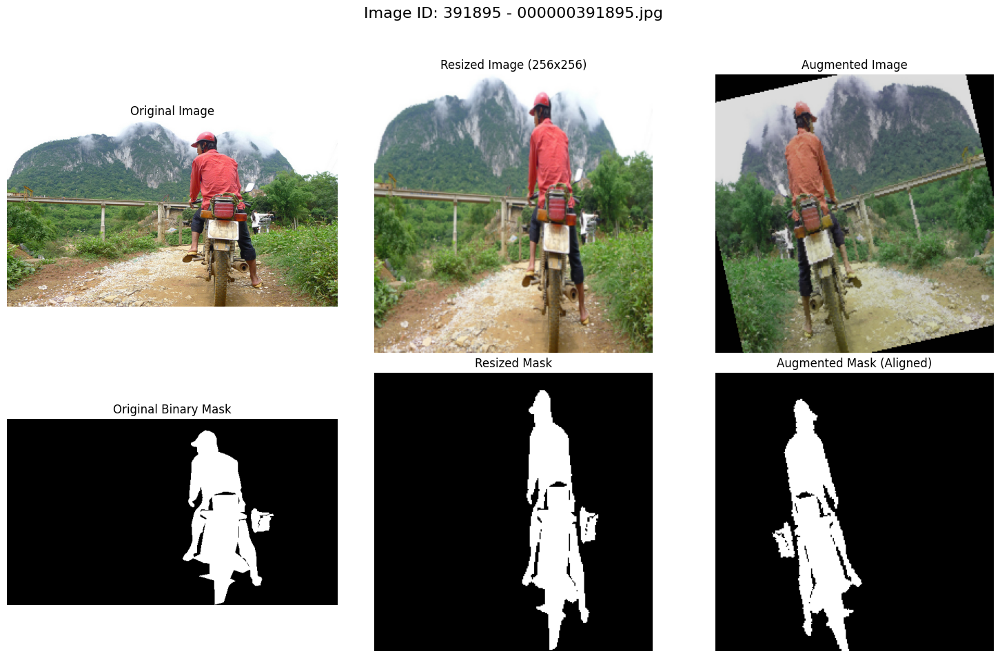

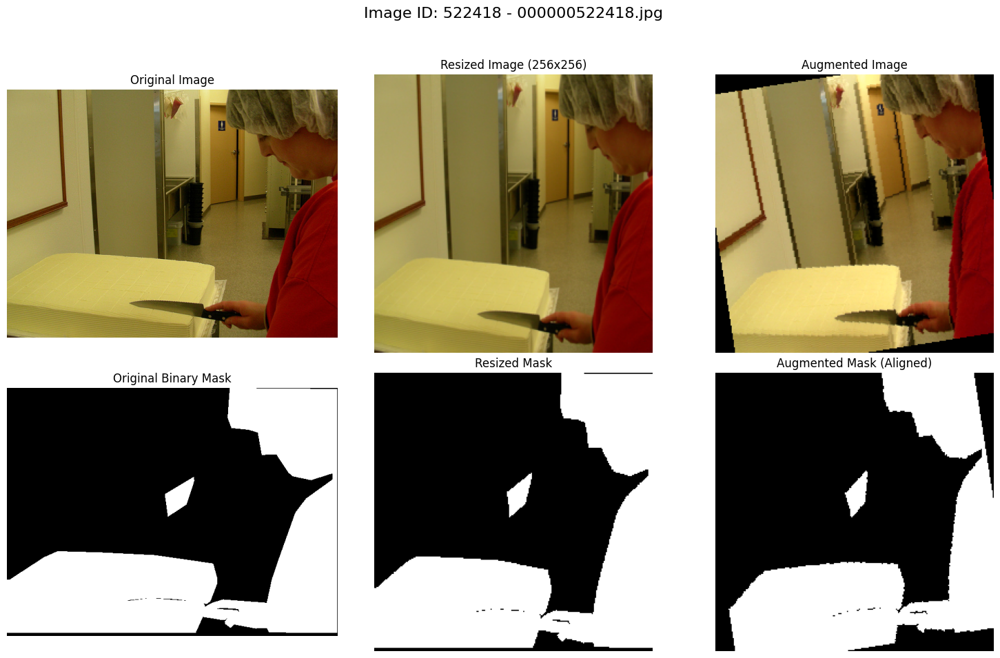

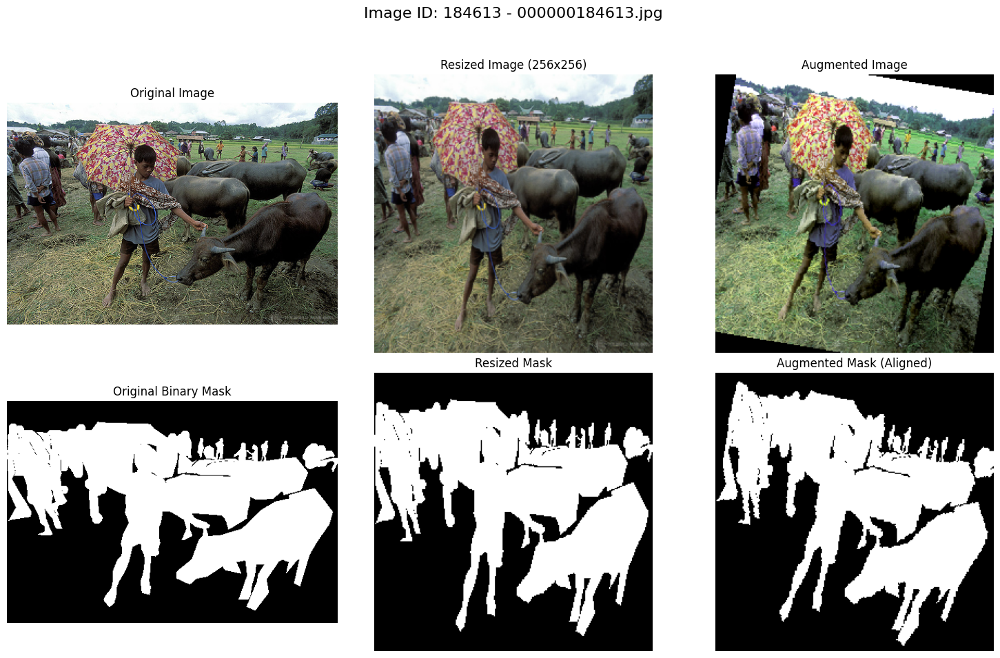

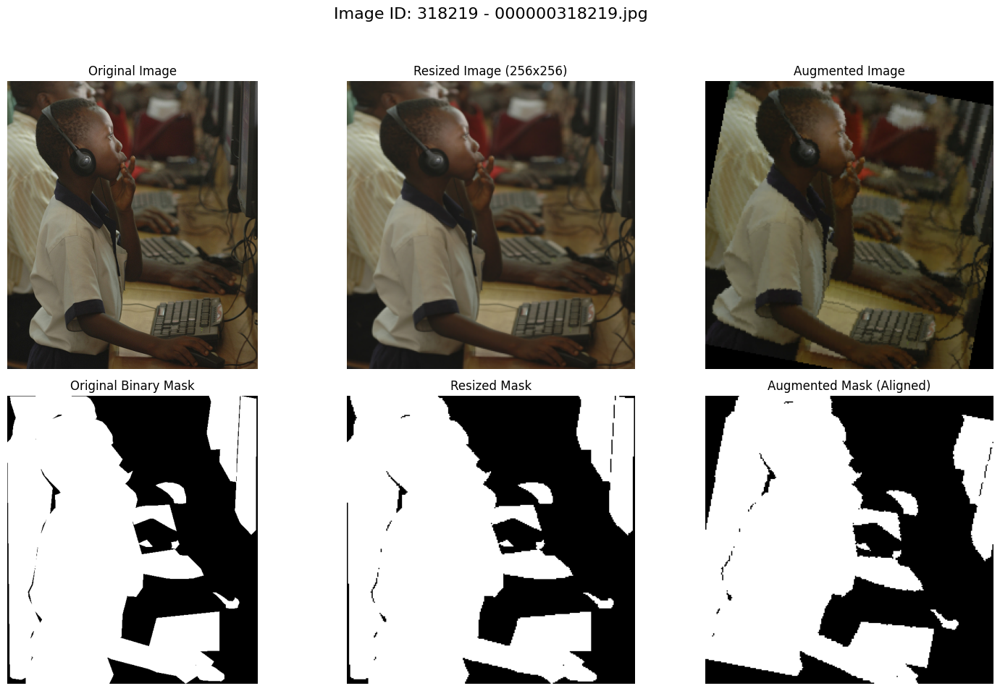

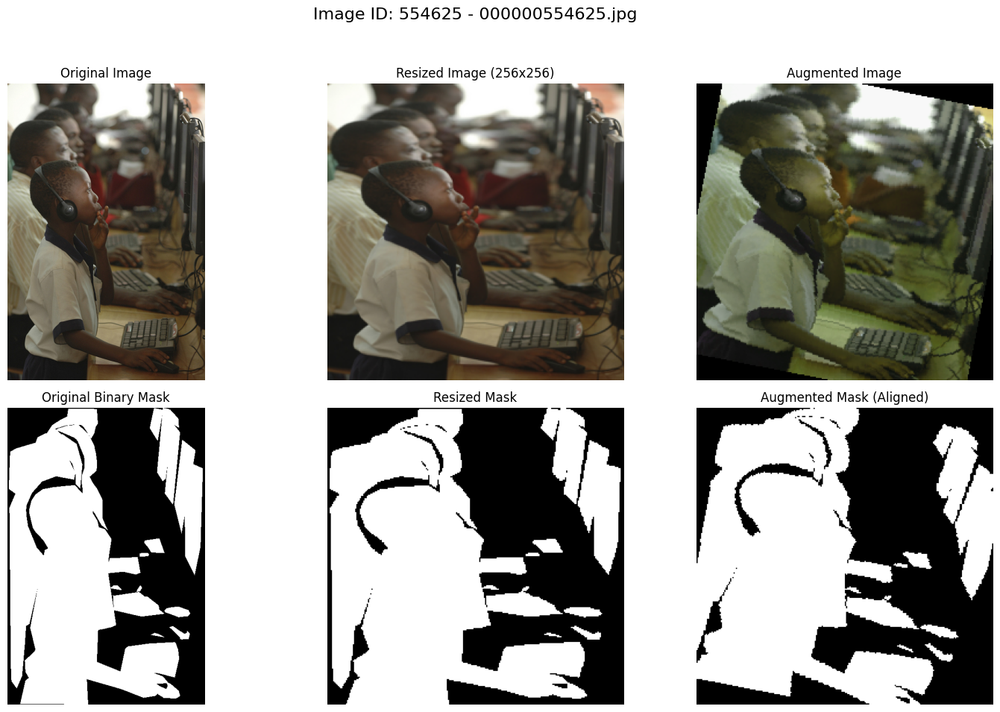

...

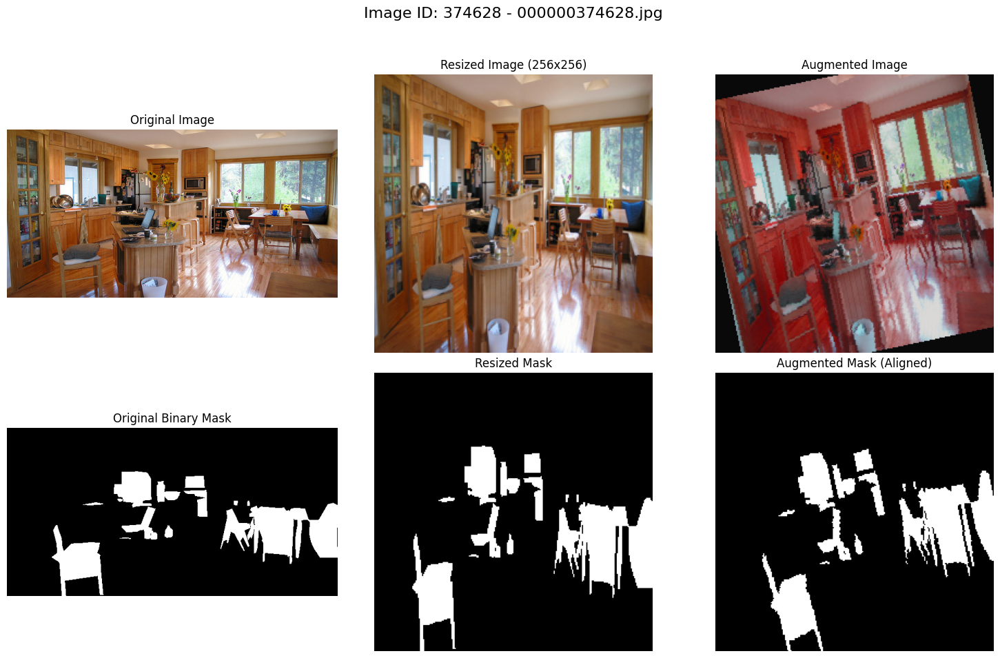

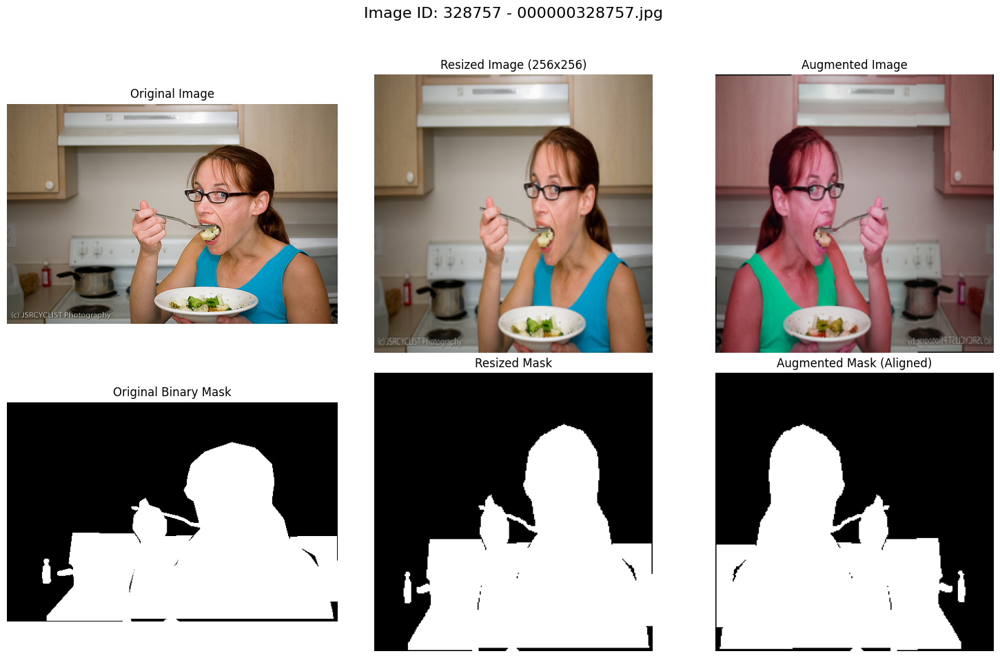

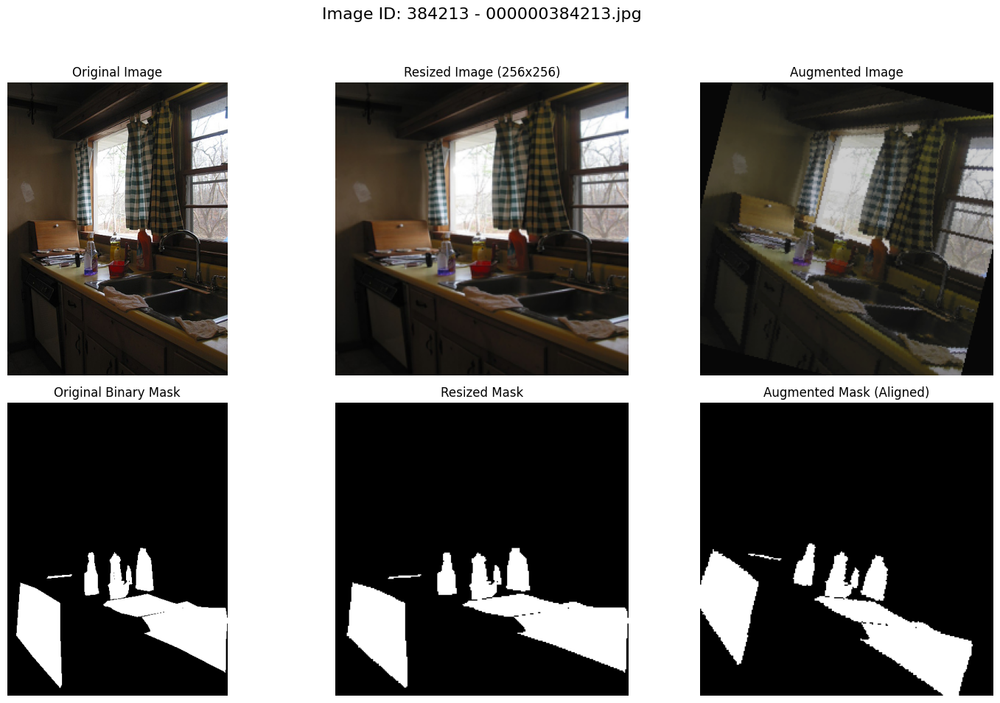

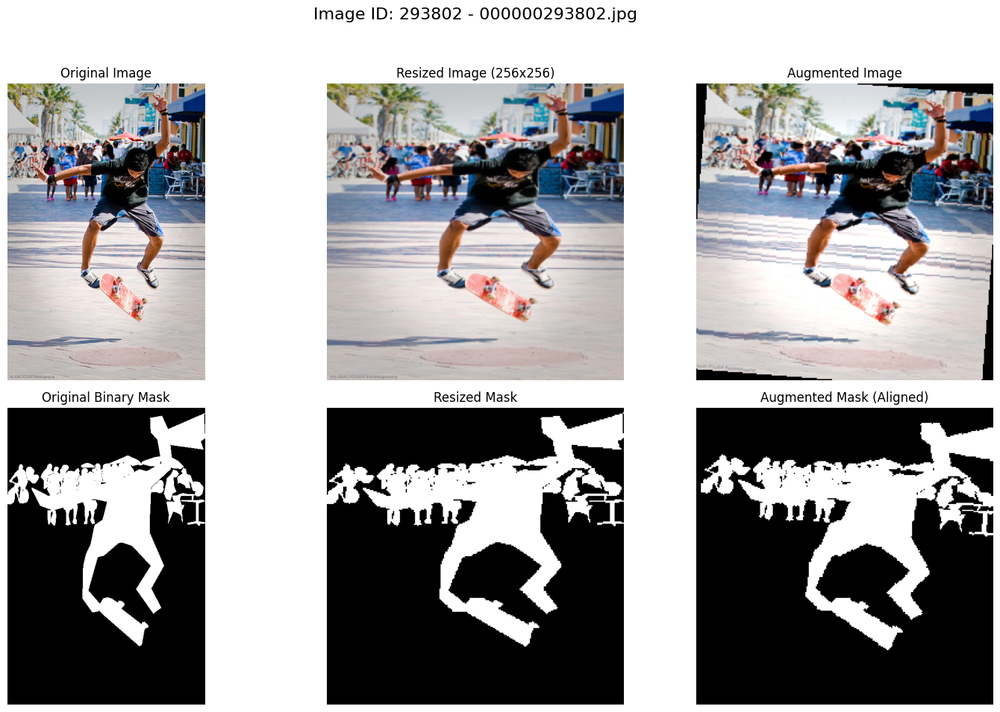

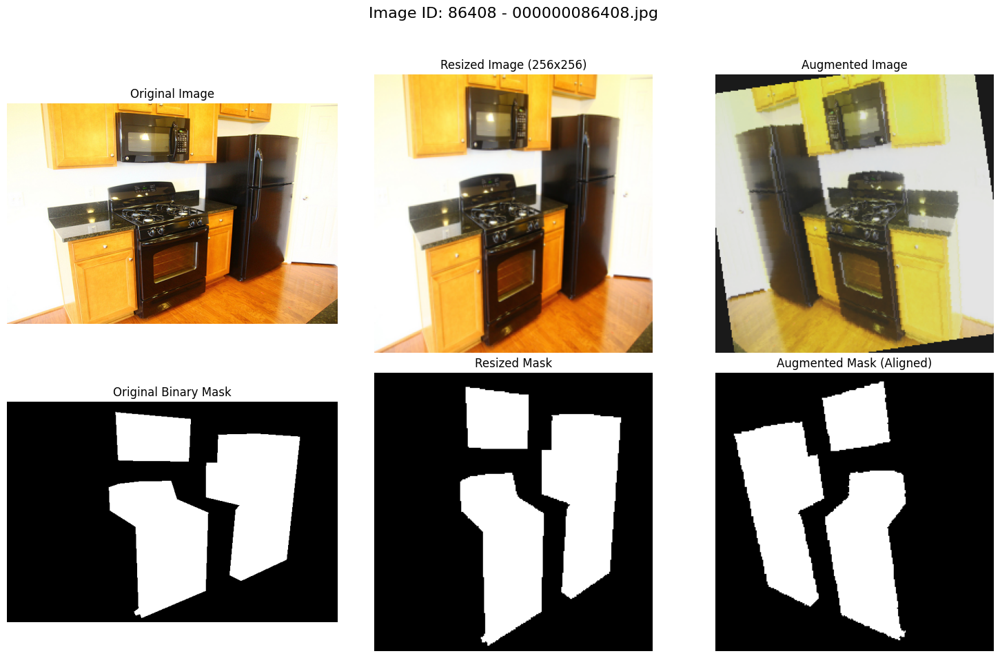

Finished processing and visualizing 20 images.


In [4]:
for imgId in imgIds:
    # --- Load Image ---
    img_info = coco.loadImgs(imgId)[0]
    img_path = os.path.join(IMAGE_DIR, img_info['file_name'])
    
    # Load image using PIL (better for torchvision)
    try:
        original_image_pil = Image.open(img_path).convert('RGB')
    except FileNotFoundError:
        print(f"Warning: Image not found {img_path}")
        continue
    annIds = coco.getAnnIds(imgIds=img_info['id'])
    anns = coco.loadAnns(annIds)
    
    h, w = img_info['height'], img_info['width']
    combined_mask_np = np.zeros((h, w), dtype=np.uint8)
    for ann in anns:
        combined_mask_np = np.maximum(combined_mask_np, coco.annToMask(ann))
        

    original_mask_pil = Image.fromarray(combined_mask_np * 255, mode='L') 

    # --- Apply Transformations ---

    # 1. Resize
    resized_image_pil = resize_transform_img(original_image_pil)
    resized_mask_pil = resize_transform_mask(original_mask_pil)

    # 2. Augmentation (Geometric)
    aug_image_pil, aug_mask_pil = apply_consistent_transforms(
        resized_image_pil, 
        resized_mask_pil, 
        augmentation_transforms
    )
    
    # Apply Color Jitter (Image only)
    aug_color_image_pil = color_jitter(aug_image_pil)

    # 3. Convert to Tensor
    original_image_tensor = to_tensor_transform(original_image_pil)
    original_mask_tensor = (to_tensor_transform(original_mask_pil) > 0).float() # Binarize to 0.0, 1.0

    resized_image_tensor = to_tensor_transform(resized_image_pil)
    resized_mask_tensor = (to_tensor_transform(resized_mask_pil) > 0).float()

    augmented_image_tensor = to_tensor_transform(aug_color_image_pil) # Use color jittered one
    augmented_mask_tensor = (to_tensor_transform(aug_mask_pil) > 0).float()

    # 4. Normalize (Image only) - Apply AFTER augmentation
    normalized_image_tensor = normalize_transform(augmented_image_tensor)
    
    # --- Visualization ---
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f"Image ID: {imgId} - {img_info['file_name']}", fontsize=16)

    # Row 1: Images
    axes[0, 0].imshow(original_image_pil)
    axes[0, 0].set_title("Original Image")
    axes[0, 0].axis('off')

    axes[0, 1].imshow(resized_image_pil)
    axes[0, 1].set_title("Resized Image (256x256)")
    axes[0, 1].axis('off')

    # Convert augmented tensor back to PIL for display (before normalization)
    axes[0, 2].imshow(transforms.ToPILImage()(augmented_image_tensor))
    axes[0, 2].set_title("Augmented Image")
    axes[0, 2].axis('off')

    # Row 2: Masks
    axes[1, 0].imshow(original_mask_pil, cmap='gray')
    axes[1, 0].set_title("Original Binary Mask")
    axes[1, 0].axis('off')

    axes[1, 1].imshow(transforms.ToPILImage()(resized_mask_tensor), cmap='gray')
    axes[1, 1].set_title("Resized Mask")
    axes[1, 1].axis('off')

    axes[1, 2].imshow(transforms.ToPILImage()(augmented_mask_tensor), cmap='gray')
    axes[1, 2].set_title("Augmented Mask (Aligned)")
    axes[1, 2].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout
    plt.show()

    # Note: We don't visualize the normalized image directly as the colors
    # will look strange. Normalization is for the model, not for viewing.
    # We could print the tensor stats if needed:
    # print("Normalized Image Tensor Stats:", normalized_image_tensor.min(), normalized_image_tensor.max(), normalized_image_tensor.mean())

print("Finished processing and visualizing 20 images.")